In [8]:
import pandas as pd
import numpy as np
from collections import Counter
import ast
from scipy.stats import norm
from sklearn.metrics import r2_score
import tiktoken
import os
import requests
import copy 
import json
from tqdm import tqdm

In [9]:
r = requests.get("http://gersteincodegenprod.s3.amazonaws.com/results-default.json")

data = json.loads(r.text)

In [17]:
backup = copy.deepcopy(data)
df = pd.DataFrame(data)
df
a = df['body'].iloc[1284]
a

{'test_case_repo': 'lilbillybiscuit/323tester',
 'file': '31fadccbfa4c31c84a58c1231b8f4cf54061f38eafeaf7507c4102fcd00bae0b.java',
 'filePath': 'none',
 'lineStart': 0,
 'lineEnd': 0,
 'test_case_id': 'codegen2-7B-v1-Java-AnnotationPrompts-31fadccbfa4c31c84a58c1231b8f4cf54061f38eafeaf7507c4102fcd00bae0b-7',
 'methodBody': 'none',
 'num_tests': 50,
 'random_stringadasd': '+GPsfS6doL0uOqTkqKiyv4fM753iw121cN8/BrmvJL8='}

In [ ]:
encoding = tiktoken.encoding_for_model("gpt-3.5-turbo")

def preprocess_dir(dir_path):
    """
    Function to preprocess a directory of text files. The function reads the files and generates a DataFrame
    with the file content, character count, word count, and token count.

    Parameters:
    dir_path (str): Directory path to preprocess

    Returns:
    df (DataFrame): A DataFrame containing file content, character count, word count, and token count.
    """
    df_list = []  # Initialize an empty list to hold dataframes

    
    for dirpath, dirnames, filenames in os.walk(dir_path):
        for f in filenames:
            file_path = os.path.join(dirpath, f)
            with open(file_path, 'r') as file:
                content = file.read()
                # Get the directory name
                dir_name = os.path.basename(os.path.dirname(file_path))
                # Create a new dataframe for each file and add it to the list
                df_list.append(pd.DataFrame({'file_entry': [content], 
                                             'char_count': [len(content)], 
                                             'word_count': [len(content.split())], 
                                             'token_count': [len(encoding.encode(content))], 
                                             'directory': [dir_name]}))

    # Concatenate all the dataframes in the list into a single dataframe
    df = pd.concat(df_list, ignore_index=True)

    return df

In [ ]:
modelPaths = ["incoder-6B", "gpt", "codegen-6B-mono", "codegen2-7B", "instructcodet5p-16b", "santacoder", "starcoder", "starcoderplus"]
df = pd.DataFrame()
for l in ["Python", "Java"]:
    dfL = pd.DataFrame()
    for m in modelPaths:
        dirPath = f"/home/ubuntu/CodeGen/BCE/Models/{m}/v1/{l}"
        df2 = preprocess_dir(dirPath)
        mType = [m for _ in range(len(df2))]
        df2['Model'] = mType
        dfL = pd.concat([dfL, df2])
    df = pd.concat([df, dfL])
    lType = [l for _ in range(len(df))]
    df['Language'] = lType
df

NameError: name 'tokenizer' is not defined

In [ ]:

modelPaths = ["incoder-6B", "gpt", "codegen-6B-mono", "codegen2-7B", "instructcodet5p-16b", "santacoder", "starcoder", "starcoderplus"]
df_list = []

for l in ["Python", "Java"]:
    for m in tqdm(modelPaths, desc='Processing models', unit='model'):
        for p in ["AnnotationPrompts", "NoCommentPrompts", "Prompts", "SmallPrompts"]:
            dirPath = f"/home/ubuntu/CodeGen/BCE/Models/{m}/v1/{l}/{p}"
            df2 = preprocess_dir(dirPath)
            df2['Model'] = m
            df2['Language'] = l
            df2['PType'] = p
            df_list.append(df2)

# Concatenate all dataframes in the list
df = pd.concat(df_list, ignore_index=True)


Processing models: 100%|██████████| 8/8 [00:36<00:00,  4.50s/model]


In [ ]:
dfJava = df[df['Language'] == 'Java'].sort_values(by='Language')
dfJava['token_count'] = dfJava['token_count'].apply(lambda x: x/6 if x > 2000 else x)
dfPy = df[df['Language'] == 'Python'].sort_values(by = 'Language')
dfPy['token_count'] = dfPy['token_count'].apply(lambda x: x/6 if x > 2000 else x)

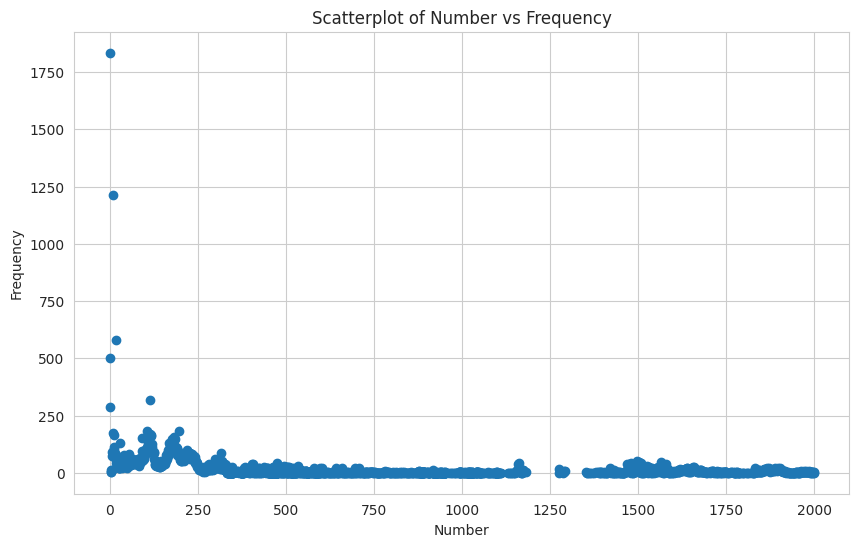

In [ ]:
counts = dfJava['token_count'].value_counts().reset_index()

# renaming columns for clarity
counts.columns = ['Number', 'Frequency']

# creating the scatterplot
plt.figure(figsize=(10,6))
plt.scatter(counts['Number'], counts['Frequency'])
plt.xlabel('Number')
plt.ylabel('Frequency')
plt.title('Scatterplot of Number vs Frequency')
plt.grid(True)
plt.show()

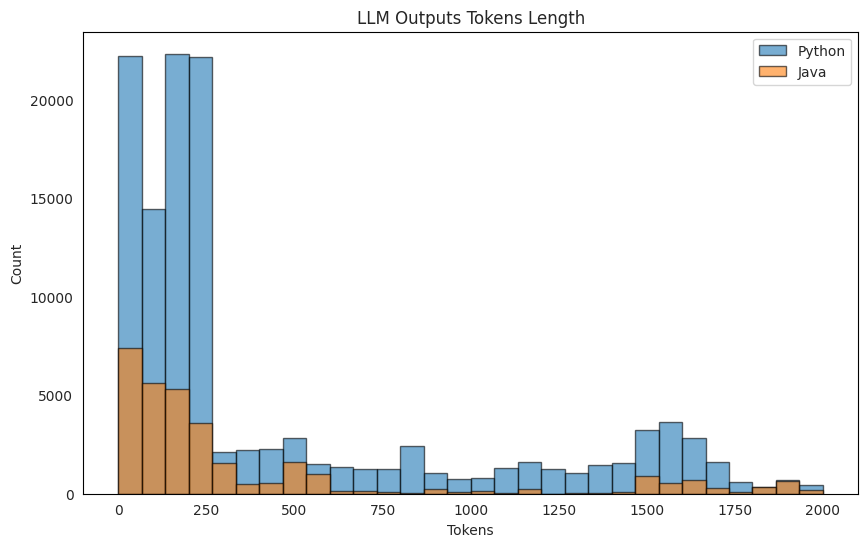

In [ ]:
plt.figure(figsize=(10, 6))

# Plot histograms using matplotlib
plt.hist(dfPy['token_count'], alpha=0.6, bins=30, edgecolor = "black", label='Python')
plt.hist(dfJava['token_count'], alpha=0.6, bins=30, edgecolor = "black", label='Java')

# Remove spines
plt.gca().spines['top'].set_color('black')
plt.gca().spines['right'].set_color('black')
plt.gca().spines['bottom'].set_color('black')
plt.gca().spines['left'].set_color('black')


# Set labels, title, and legend
plt.grid(False)
plt.xlabel('Tokens')
plt.ylabel('Count')
plt.title('LLM Outputs Tokens Length')
plt.legend()

# Show the plot
plt.show()

In [ ]:
with open("/home/ubuntu/CodeGen/BCE/all the stats data/results_individual.json.2", 'r') as f:
        outs = json.load(f)

In [ ]:
df['Model'] = df['Model'].replace("instructcodet5p", "instructcodet5p-16b")


outs["incoder-6B"]["-Prompts-"]["Java"]["incoder-6B-v1-Java-Prompts-96965beaa334772b565134a32a15ea8e8281adba044b212b4fc734fec0802e96"]["5"]

Model, Promptype, Language, File, Filenum

In [ ]:
k = outs["incoder-6B"]["-SmallPrompts-"]["Java"]["incoder-6B-v1-Python-SmallPrompts-63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e73812909e689653f907"]
total = sum(k.values())
total

KeyError: '-SmallPrompts-'

In [ ]:
outs["instructcodet5p-16b"]['-AnnotationPrompts-']['Python']["instructcodet5p-16b-v1-Python-AnnotationPrompts-c579ca270fc7f38a8244cb3ebec2665ac2fc4bc753cd3a2798f43842aefb50ee"]

KeyError: 'instructcodet5p-16b'

In [ ]:
df

,file_entry,char_count,word_count,token_count,directory,Model,Language,PType
0,"def erosion(x_data, structuring_element):\n ...",893,109,211,63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e7...,incoder-6B,Python,AnnotationPrompts
1,#YOUR CODE HERE\n\n#check that the input image...,805,107,214,63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e7...,incoder-6B,Python,AnnotationPrompts
2,"def erosion(x_data, structuring_element):\n ...",915,103,215,63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e7...,incoder-6B,Python,AnnotationPrompts
3,"def erosion(x_data, structuring_element):\n ...",838,74,215,63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e7...,incoder-6B,Python,AnnotationPrompts
4,#raise NotImplementedError('This code has not ...,957,157,214,63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e7...,incoder-6B,Python,AnnotationPrompts
...,...,...,...,...,...,...,...,...
132475,\nimport java.util.Map;\nimport java.util.Hash...,639,69,156,2dfa2ff6485ec27cfff9f3aba3668950e37f273486e136...,starcoderplus,Java,SmallPrompts
132476,# Do not write any code that is not required f...,105,22,24,2dfa2ff6485ec27cfff9f3aba3668950e37f273486e136...,starcoderplus,Java,SmallPrompts
132477,# Do not change the names of the variables.\n#...,794,158,183,2dfa2ff6485ec27cfff9f3aba3668950e37f273486e136...,starcoderplus,Java,SmallPrompts
132478,\n# Do not use the provided variables or metho...,729,154,170,2dfa2ff6485ec27cfff9f3aba3668950e37f273486e136...,starcoderplus,Java,SmallPrompts


In [ ]:
average_pak = []
for ind, row in df.iterrows():
    m = row['Model']
    l = row['Language']
    p = row['PType']
    path = row['directory']      
    

    p3 = '-' + p + '-'
    paths = f'{m}-v1-{l}-{p}-{path}'
    try:
        json_paths = outs[m][p3][l][paths]
        print(paths)
    except Exception as e:
        print(e)
        print(json_paths)
        print(paths)
        print(m)
        print(l)
        print(p)
        print(p3)
        break
    average_pak.append(sum(json_paths.values())/5)


incoder-6B-v1-Python-AnnotationPrompts-63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e73812909e689653f907
incoder-6B-v1-Python-AnnotationPrompts-63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e73812909e689653f907
incoder-6B-v1-Python-AnnotationPrompts-63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e73812909e689653f907
incoder-6B-v1-Python-AnnotationPrompts-63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e73812909e689653f907
incoder-6B-v1-Python-AnnotationPrompts-63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e73812909e689653f907
incoder-6B-v1-Python-AnnotationPrompts-63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e73812909e689653f907
incoder-6B-v1-Python-AnnotationPrompts-63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e73812909e689653f907
incoder-6B-v1-Python-AnnotationPrompts-63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e73812909e689653f907
incoder-6B-v1-Python-AnnotationPrompts-63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e73812909e689653f907
incoder-6B-v1-Python-AnnotationPrompts-63e7ba3e0826dbfb3673b619c

In [ ]:
df['PAK'] = average_pak

In [ ]:
df.shape

(132480, 9)

,file_entry,char_count,word_count,token_count,directory,Model,Language,PType,PAK
200,#\n#\n#\n#\n#\n#\n#\n#\n#\n#\n#\n#\n#\n#\n#\n#...,175,88,88,170b6c485c7fb8615b77e7b45b05663f2dab22033dd13d...,incoder-6B,Python,AnnotationPrompts,0.360000
201,"#Write another function called ""fasta_list_has...",960,149,200,170b6c485c7fb8615b77e7b45b05663f2dab22033dd13d...,incoder-6B,Python,AnnotationPrompts,0.360000
202,def is_protein(string):\n prots = string.tr...,824,108,190,170b6c485c7fb8615b77e7b45b05663f2dab22033dd13d...,incoder-6B,Python,AnnotationPrompts,0.360000
203,"#Write a function called ""fasta_file_has_prote...",980,158,206,170b6c485c7fb8615b77e7b45b05663f2dab22033dd13d...,incoder-6B,Python,AnnotationPrompts,0.360000
204,#\n#\n#\n#\n#\n#\n#\n#\n#\n#\n#\n#\n#\n#\n#\n#...,175,88,88,170b6c485c7fb8615b77e7b45b05663f2dab22033dd13d...,incoder-6B,Python,AnnotationPrompts,0.360000
...,...,...,...,...,...,...,...,...,...
129235,\npublic int toInt(String intStr) {\n\treturn ...,751,117,173,c1982667baff5d8b480e831f4d15d1041d06fb28e4ba2c...,starcoderplus,Java,AnnotationPrompts,0.462105
129236,"#In order to test your function, please run th...",642,67,161,c1982667baff5d8b480e831f4d15d1041d06fb28e4ba2c...,starcoderplus,Java,AnnotationPrompts,0.462105
129237,\npublic class MyMain {\n // This method re...,731,94,183,c1982667baff5d8b480e831f4d15d1041d06fb28e4ba2c...,starcoderplus,Java,AnnotationPrompts,0.462105
129238,\n#use the function you just created and print...,891,144,184,c1982667baff5d8b480e831f4d15d1041d06fb28e4ba2c...,starcoderplus,Java,AnnotationPrompts,0.462105


In [ ]:
df

,file_entry,char_count,word_count,token_count,directory,Model,Language,PType,PAK
0,"def erosion(x_data, structuring_element):\n ...",893,109,211,63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e7...,incoder-6B,Python,AnnotationPrompts,0.0
1,#YOUR CODE HERE\n\n#check that the input image...,805,107,214,63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e7...,incoder-6B,Python,AnnotationPrompts,0.0
2,"def erosion(x_data, structuring_element):\n ...",915,103,215,63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e7...,incoder-6B,Python,AnnotationPrompts,0.0
3,"def erosion(x_data, structuring_element):\n ...",838,74,215,63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e7...,incoder-6B,Python,AnnotationPrompts,0.0
4,#raise NotImplementedError('This code has not ...,957,157,214,63e7ba3e0826dbfb3673b619c5caa94f1aba97ba1309e7...,incoder-6B,Python,AnnotationPrompts,0.0
...,...,...,...,...,...,...,...,...,...
132475,\nimport java.util.Map;\nimport java.util.Hash...,639,69,156,2dfa2ff6485ec27cfff9f3aba3668950e37f273486e136...,starcoderplus,Java,SmallPrompts,0.0
132476,# Do not write any code that is not required f...,105,22,24,2dfa2ff6485ec27cfff9f3aba3668950e37f273486e136...,starcoderplus,Java,SmallPrompts,0.0
132477,# Do not change the names of the variables.\n#...,794,158,183,2dfa2ff6485ec27cfff9f3aba3668950e37f273486e136...,starcoderplus,Java,SmallPrompts,0.0
132478,\n# Do not use the provided variables or metho...,729,154,170,2dfa2ff6485ec27cfff9f3aba3668950e37f273486e136...,starcoderplus,Java,SmallPrompts,0.0


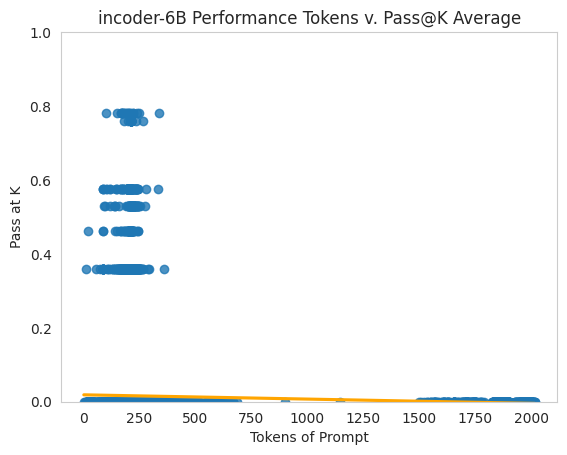

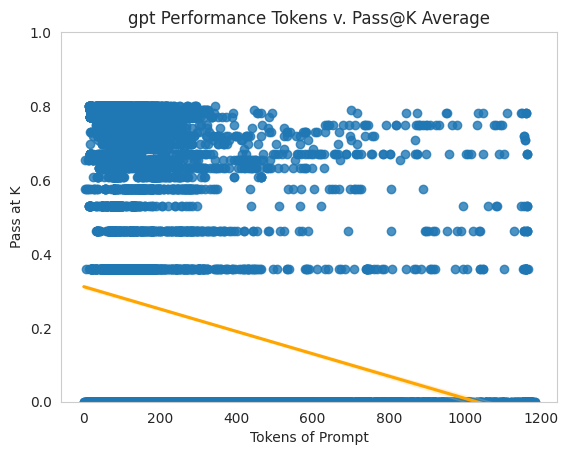

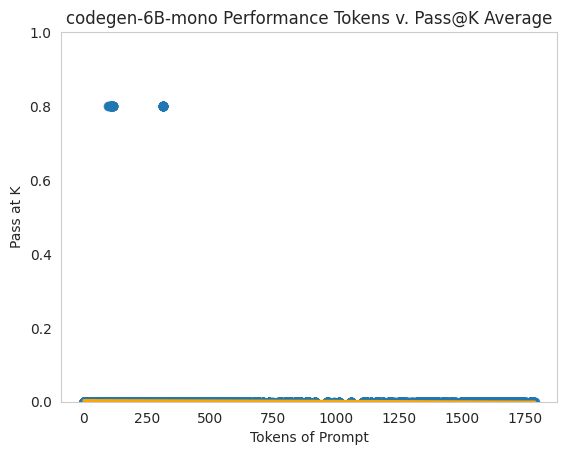

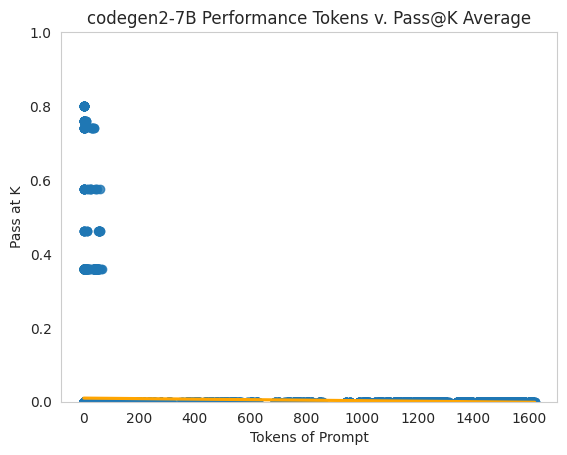

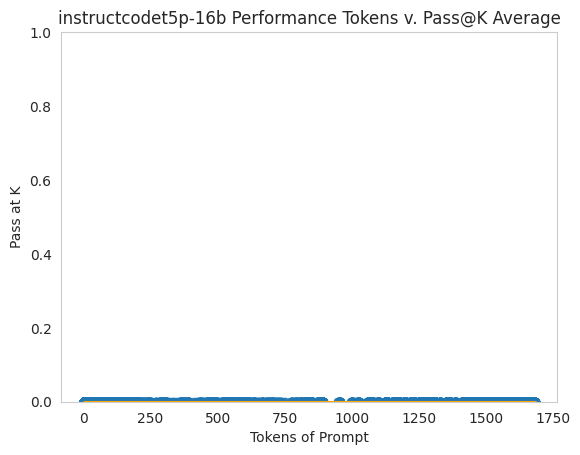

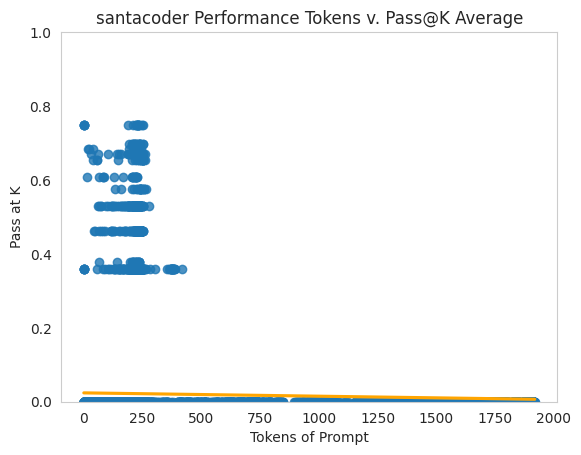

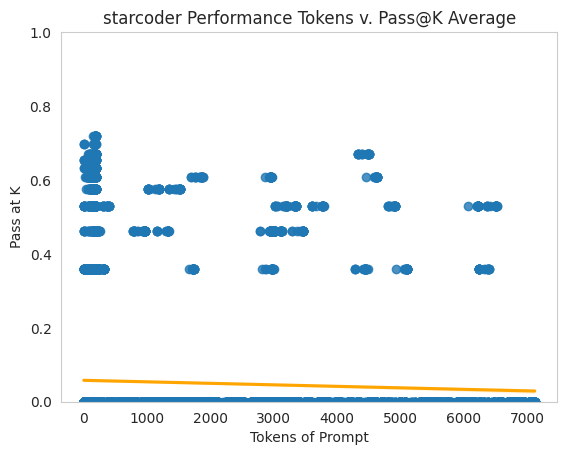

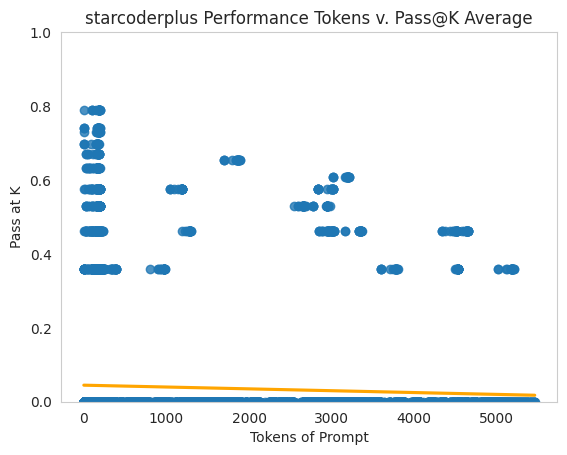

In [ ]:
for m in modelPaths:
    dftemp = df[df['Model'] == m]
    sns.regplot(data=dftemp, x="token_count", y="PAK", line_kws={'color': 'orange'})
    plt.grid(False)
    plt.title(f"{m} Performance Tokens v. Pass@K Average")
    plt.ylabel("Pass at K")
    plt.ylim(0,1)
    plt.xlabel("Tokens of Prompt")
    plt.show()


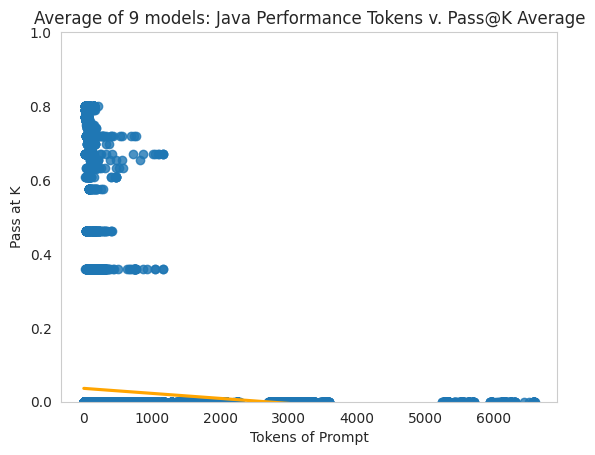

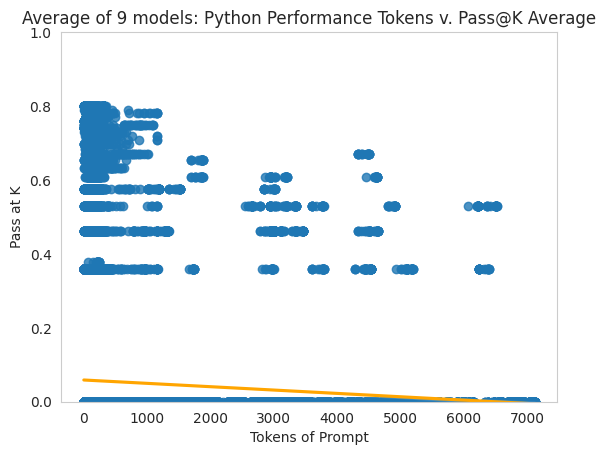

In [ ]:
for m in ['Java', 'Python']:
    dftemp = df[df['Language'] == m]
    sns.regplot(data=dftemp, x="token_count", y="PAK", line_kws={'color': 'orange'})
    plt.grid(False)
    plt.title(f"Average of 9 models: {m} Performance Tokens v. Pass@K Average")
    plt.ylabel("Pass at K")
    plt.ylim(0,1)
    plt.xlabel("Tokens of Prompt")
    plt.show()


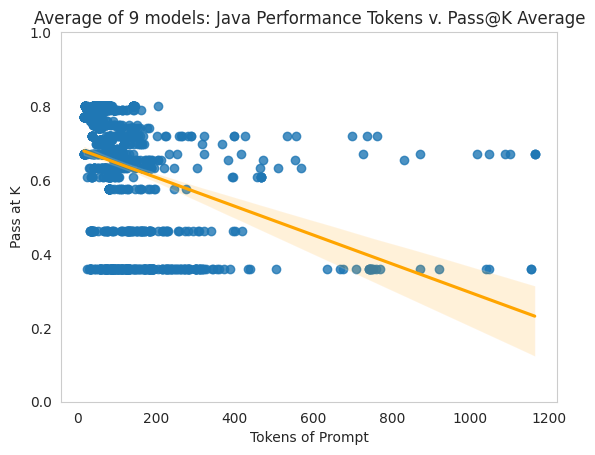

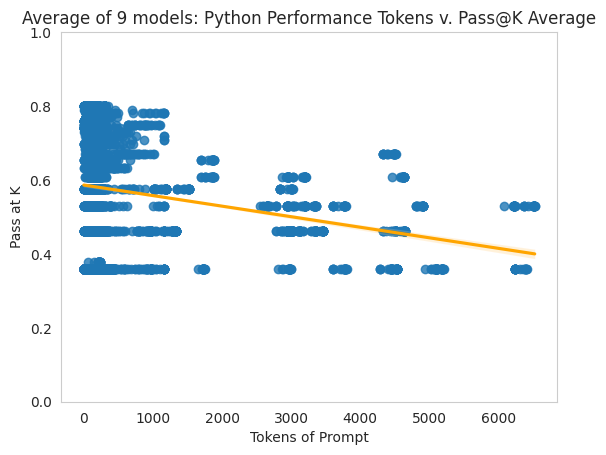

In [ ]:
for m in ['Java', 'Python']:
    dftemp = df[df['Language'] == m]
    dftemp = dftemp[dftemp['PAK'] > 0]
    sns.regplot(data=dftemp, x="token_count", y="PAK", line_kws={'color': 'orange'})
    plt.grid(False)
    plt.title(f"Average of 9 models: {m} Performance Tokens v. Pass@K Average")
    plt.ylabel("Pass at K")
    plt.ylim(0,1)
    plt.xlabel("Tokens of Prompt")
    plt.show()
